# Ablation studies of Bayesian-ARGOS on the Rössler system

This notebook compares the baseline Bayesian-ARGOS algorithm (`bayesian-alasso-ro`,
Ridge-OLS adaptive lasso weights) against its ablation variants defined in
`R/bayesian_alasso_abl.R`:

| Experiment | Initial weights | Final weights | Stages |
|---|---|---|---|
| `bayesian-alasso-ro` (baseline) | Ridge | OLS | 2 |
| `bayesian-alasso-or` | OLS | Ridge | 2 |
| `bayesian-alasso-oo` | OLS | OLS | 2 |
| `bayesian-alasso-rr` | Ridge | Ridge | 2 |
| `bayesian-alasso-single-ols` | - | OLS | 1 (no library shrinkage) |
| `bayesian-alasso-single-ridge` | - | Ridge | 1 (no library shrinkage) |


### Import the required libraries and files


In [1]:
# Load ggplot2 first as it's a core dependency
library(ggplot2)
# Explicitly import ggproto
ggproto <- ggplot2::ggproto
Stat <- ggplot2::Stat

# Then load other visualization packages
library(plot3D)
library(tidyr)
library(tidyverse)
library(scales)
library(latex2exp)
library(cowplot)
library(ggh4x)
library(ggpubr)
library(gridExtra)
library(patchwork)
library(RColorBrewer)
library(stringr)
library(dplyr)

Warning message:
“no DISPLAY variable so Tk is not available”


── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.2.1     ✔ readr     2.2.0
✔ forcats   1.0.1     ✔ stringr   1.6.0
✔ lubridate 1.9.5     ✔ tibble    3.3.1
✔ purrr     1.2.2     


── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors



Attaching package: ‘scales’




The following object is masked from ‘package:purrr’:

    discard




The following object is masked from ‘package:readr’:

    col_factor





Attaching package: ‘cowplot’




The following object is masked from ‘package:lubridate’:

    stamp





Attaching package: ‘ggpubr’




The following object is masked from ‘package:cowplot’:

    get_legend





Attaching package: ‘gridExtra’




The following object is masked from ‘package:dplyr’:

    combine





Attaching package: ‘patchwork’




The following object is masked from ‘package:cowplot’:

    align_plots




In [2]:
nbfigsize <- function(width, height) {
    options(repr.plot.width = width, repr.plot.height = height, repr.plot.res = 300)
}

In [3]:
setwd(dirname(dirname(getwd())))

In [4]:
source("./MethodsEvaluation/results_processing_for_analysis.R")
source("./Pysindy/utils/pysindy_results_processing_for_analysis.R")

### General parameters settings


In [5]:
dynamical_system_name <- "rossler"
true_terms_1 <- list("x2", "x3")
true_terms_2 <- list("x1", "x2")
true_terms_3 <- list("(Intercept)", "x1x3", "x3")
true_terms_4 <- NULL

In [6]:
root_path <- getwd()
experiment_name_list <- list(
    "bayesian-alasso-ro",
    "bayesian-alasso-or",
    "bayesian-alasso-oo",
    "bayesian-alasso-rr",
    "bayesian-alasso-single-ols",
    "bayesian-alasso-single-ridge"
)
method_list <- experiment_name_list
function_number <- 3
num_init <- 100

### Success rate generation for various number of observations n


In [7]:
exp_n <- TRUE
typical_pattern <- "snr49"
start <- 2
number_step <- 0.1

total_success_rate_table_n <- generate_total_success_rate_table(
    root_path = root_path,
    experiment_name_list = experiment_name_list,
    method_list = method_list,
    function_number = function_number,
    num_init = num_init,
    dynamical_system_name = dynamical_system_name,
    exp_n = exp_n,
    typical_pattern = typical_pattern,
    true_terms_1 = true_terms_1,
    true_terms_2 = true_terms_2,
    true_terms_3 = true_terms_3,
    true_terms_4 = true_terms_4,
    start = start,
    number_step = number_step
)

total_success_rate_table_n <- rename_model_names(total_success_rate_table_n)
tail(total_success_rate_table_n)

[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-ro/rossler/results/rossler_1_e2_e3_se100_snr49.RData"
[2] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-ro/rossler/results/rossler_1_e3_e4_se100_snr49.RData"
[3] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-ro/rossler/results/rossler_1_e4_e5_se100_snr49.RData"
[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-ro/rossler/results/rossler_2_e2_e3_se100_snr49.RData"
[2] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-ro/rossler/results/rossler_2_e3_e4_se100_snr49.RData"
[3] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-ro/rossler/results/rossler_2_e4_e5_se100_snr49.RData"
[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-ro/rossler/results/rossler_3_e2_e3_se100_snr49.RData"
[2] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-ro/rossler/results/rossler_3_e3_e4_se100_snr49

Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-or/rossler/results/rossler_1_e2_e3_se100_snr49.RData"
[2] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-or/rossler/results/rossler_1_e3_e4_se100_snr49.RData"
[3] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-or/rossler/results/rossler_1_e4_e5_se100_snr49.RData"
[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-or/rossler/results/rossler_2_e2_e3_se100_snr49.RData"
[2] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-or/rossler/results/rossler_2_e3_e4_se100_snr49.RData"
[3] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-or/rossler/results/rossler_2_e4_e5_se100_snr49.RData"
[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-or/rossler/results/rossler_3_e2_e3_se100_snr49.RData"
[2] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-or/rossler/results/rossler_3_e3_e4_se100_snr49

Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-oo/rossler/results/rossler_1_e2_e3_se100_snr49.RData"
[2] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-oo/rossler/results/rossler_1_e3_e4_se100_snr49.RData"
[3] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-oo/rossler/results/rossler_1_e4_e5_se100_snr49.RData"
[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-oo/rossler/results/rossler_2_e2_e3_se100_snr49.RData"
[2] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-oo/rossler/results/rossler_2_e3_e4_se100_snr49.RData"
[3] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-oo/rossler/results/rossler_2_e4_e5_se100_snr49.RData"
[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-oo/rossler/results/rossler_3_e2_e3_se100_snr49.RData"
[2] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-oo/rossler/results/rossler_3_e3_e4_se100_snr49

Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-rr/rossler/results/rossler_1_e2_e3_se100_snr49.RData"
[2] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-rr/rossler/results/rossler_1_e3_e4_se100_snr49.RData"
[3] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-rr/rossler/results/rossler_1_e4_e5_se100_snr49.RData"
[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-rr/rossler/results/rossler_2_e2_e3_se100_snr49.RData"
[2] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-rr/rossler/results/rossler_2_e3_e4_se100_snr49.RData"
[3] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-rr/rossler/results/rossler_2_e4_e5_se100_snr49.RData"
[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-rr/rossler/results/rossler_3_e2_e3_se100_snr49.RData"
[2] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-rr/rossler/results/rossler_3_e3_e4_se100_snr49

Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-single-ols/rossler/results/rossler_1_e2_e3_se100_snr49.RData"
[2] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-single-ols/rossler/results/rossler_1_e3_e4_se100_snr49.RData"
[3] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-single-ols/rossler/results/rossler_1_e4_e5_se100_snr49.RData"
[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-single-ols/rossler/results/rossler_2_e2_e3_se100_snr49.RData"
[2] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-single-ols/rossler/results/rossler_2_e3_e4_se100_snr49.RData"
[3] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-single-ols/rossler/results/rossler_2_e4_e5_se100_snr49.RData"
[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-single-ols/rossler/results/rossler_3_e2_e3_se100_snr49.RData"
[2] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesi

Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-single-ridge/rossler/results/rossler_1_e2_e3_se100_snr49.RData"
[2] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-single-ridge/rossler/results/rossler_1_e3_e4_se100_snr49.RData"
[3] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-single-ridge/rossler/results/rossler_1_e4_e5_se100_snr49.RData"
[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-single-ridge/rossler/results/rossler_2_e2_e3_se100_snr49.RData"
[2] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-single-ridge/rossler/results/rossler_2_e3_e4_se100_snr49.RData"
[3] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-single-ridge/rossler/results/rossler_2_e4_e5_se100_snr49.RData"
[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-single-ridge/rossler/results/rossler_3_e2_e3_se100_snr49.RData"
[2] "/home/yuzhengz/Projects/Bayesian-ARGOS/Expe

Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


,eta,Condition,Value,Model
,<dbl>,<chr>,<dbl>,<chr>
181,4.5,Correct,0.97,Bayesian-ARGOS (Single Ridge)
182,4.6,Correct,0.99,Bayesian-ARGOS (Single Ridge)
183,4.7,Correct,1.00,Bayesian-ARGOS (Single Ridge)
184,4.8,Correct,0.97,Bayesian-ARGOS (Single Ridge)
185,4.9,Correct,0.98,Bayesian-ARGOS (Single Ridge)
186,5.0,Correct,0.95,Bayesian-ARGOS (Single Ridge)


#### Plot the success rate for various n


##### General Plot settings for success rate


In [8]:
ggplot_theme0 <- theme(
    axis.line = element_line(colour = "black"),
    axis.ticks.length = unit(.25, "cm"),
    panel.grid.major = element_blank(),
    panel.grid.minor = element_blank(),
    panel.border = element_blank(),
    panel.background = element_blank(),
    legend.key = element_blank(),
    legend.text = element_text(size = 20),
    # Changed for legend
    legend.title = element_text(face = "bold", size = 26),
    axis.text = element_text(size = 20),
    axis.title.x = element_text(size = 22),
    axis.title.y = element_text(
        size = 22,
        angle = 90,
        vjust = 0.5
    ),
    plot.title = element_text(size = 22),
    plot.tag = element_text(size = 28),
    legend.position = "none",
    # plot.margin = margin(t = 0.75, r = 0.25, b = 0.25, l = 0.25, unit = "in")
    plot.margin = margin(t = 0.75, r = 0.1, b = 0.25, l = 0.1, unit = "in")
)
ggplot_theme1 <- ggplot_theme0 + theme(plot.background = element_rect(fill = 0, colour = 0))

create_separators <- function(x, extra_x, y, extra_y, angle = 45, scale = 1, length = .1) {
    add_y <- length * sin(angle * pi / 180) / 2
    add_x <- length * cos(angle * pi / 180)
    list(
        x = x - add_x * scale, xend = x + add_x * scale + extra_x,
        y = rep(y - add_y * scale - extra_y, length(x)), yend = rep(y + add_y * scale - extra_y / 2, length(x))
    )
}

# - Shared aesthetics for the six ablation configurations
colors_correct <- c("#505ed5", "#d74d3d", "#8eb63d", "#EF60AD", "#9467bd", "#00A08A")
shapes <- c(15, 16, 17, 18, 19, 8)

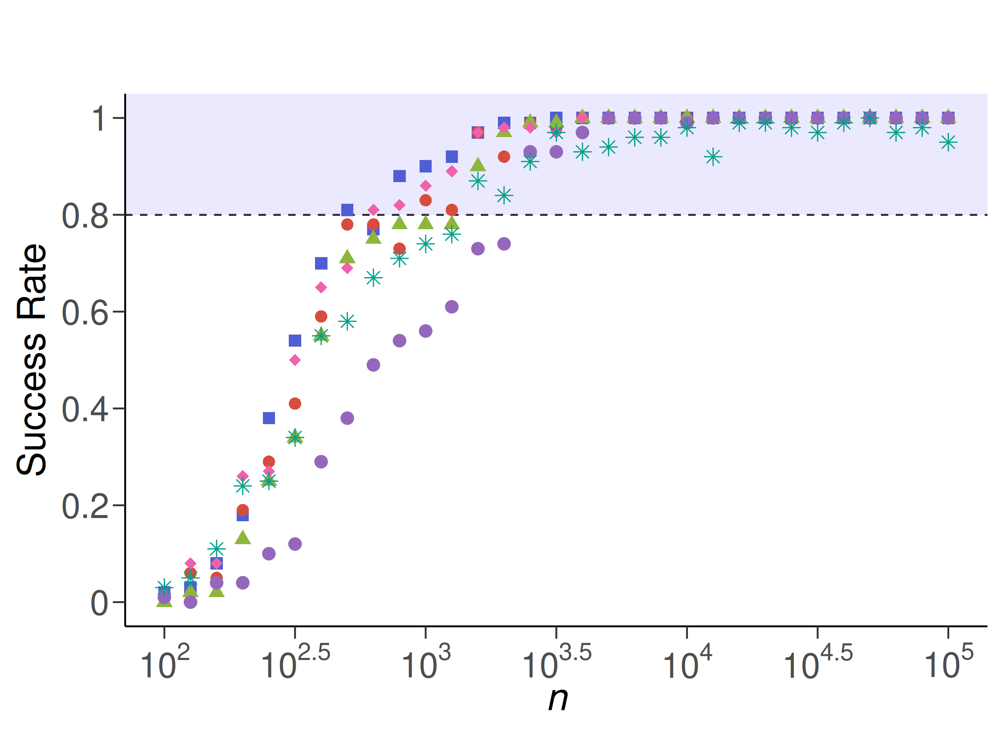

In [9]:
# - Parameters settings for success rate plot (N)
total_correct <- total_success_rate_table_n
models_name <- unique(total_correct$Model)
total_correct$Model <- factor(total_correct$Model, levels = models_name)
n_seq <- seq(2, 5, by = 0.1)
rect1 <- data.frame(xmin = -Inf, xmax = Inf, ymin = 0.8, ymax = Inf)

x_labels <- c(
    expression(paste("10"^"2")),
    expression(paste("10"^"2.5")),
    expression(paste("10"^"3")),
    expression(paste("10"^"3.5")),
    expression(paste("10"^"4")),
    expression(paste("10"^"4.5")),
    expression(paste("10"^"5"))
)

x_breaks <- pretty_breaks()(n_seq)
y_breaks <-
    y_labels <- pretty_breaks()(c(0, max(total_correct$Value)))

prob_increase_n <-
    ggplot() +
    geom_hline(yintercept = 0.8, lty = 2) +
    geom_rect(data = rect1, aes(xmin = xmin, xmax = xmax, ymin = ymin, ymax = ymax), alpha = 0.3, fill = "#BDB6FB") +
    geom_point(
        data = total_correct,
        aes(
            x = eta,
            y = Value,
            fill = Model,
            col = Model,
            shape = Model
        ), size = 3
    ) +
    labs(
        y = "Success Rate",
        x = expression(italic("n"))
    ) +
    scale_x_continuous(
        labels = x_labels,
        breaks = x_breaks
    ) +
    scale_y_continuous(
        labels = y_labels,
        breaks = y_breaks,
        limits = c(0, max(y_labels))
    ) +
    ggplot_theme1 +
    scale_fill_manual(values = colors_correct, breaks = models_name, labels = models_name) +
    scale_colour_manual(values = colors_correct, breaks = models_name, labels = models_name) +
    scale_shape_manual(values = shapes, breaks = models_name, labels = models_name)

nbfigsize(
    width = 8,
    height = 6
)

prob_increase_n

### Success rate generation for various snr values


In [10]:
exp_n <- FALSE
typical_pattern <- "n5000"
start <- 1
number_step <- 1

# - Generate the total success rate table
total_success_rate_table_snr <- generate_total_success_rate_table(
    root_path = root_path,
    experiment_name_list = experiment_name_list,
    method_list = method_list,
    function_number = function_number,
    num_init = num_init,
    dynamical_system_name = dynamical_system_name,
    exp_n = exp_n,
    typical_pattern = typical_pattern,
    true_terms_1 = true_terms_1,
    true_terms_2 = true_terms_2,
    true_terms_3 = true_terms_3,
    true_terms_4 = NULL,
    start = start,
    number_step = number_step
)

total_success_rate_table_snr <- rename_model_names(total_success_rate_table_snr)
tail(total_success_rate_table_snr)

[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-ro/rossler/results/rossler_1_snr1_snr61_se100_n5000.RData"
[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-ro/rossler/results/rossler_2_snr1_snr61_se100_n5000.RData"
[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-ro/rossler/results/rossler_3_snr1_snr61_se100_n5000.RData"
[1] 1
[1] 100
[1] 2
[1] 100
[1] 3
[1] 100
[1] 4
[1] 100
[1] 5
[1] 100
[1] 6
[1] 100
[1] 7
[1] 100
[1] 8
[1] 100
[1] 9
[1] 100
[1] 10
[1] 100
[1] 11
[1] 100
[1] 12
[1] 100
[1] 13
[1] 100
[1] 14
[1] 100
[1] 15
[1] 100
[1] 16
[1] 100
[1] 17
[1] 100
[1] 18
[1] 100
[1] 19
[1] 100
[1] 20
[1] 100
[1] 21
[1] 100
[1] 22
[1] 100
[1] 23
[1] 100
[1] 24
[1] 100
[1] 25
[1] 100
[1] 26
[1] 100
[1] 27
[1] 100
[1] 28
[1] 100
[1] 29
[1] 100
[1] 30
[1] 100
[1] 31
[1] 100
[1] 32
[1] 100
[1] 33
[1] 100
[1] 34
[1] 100
[1] 35
[1] 100
[1] 36
[1] 100
[1] 37
[1] 100
[1] 38
[1] 100
[1] 39
[1] 100
[1] 40
[1] 100
[1] 41
[1] 100
[

Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-or/rossler/results/rossler_1_snr1_snr61_se100_n5000.RData"
[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-or/rossler/results/rossler_2_snr1_snr61_se100_n5000.RData"
[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-or/rossler/results/rossler_3_snr1_snr61_se100_n5000.RData"
[1] 1
[1] 100
[1] 2
[1] 100
[1] 3
[1] 100
[1] 4
[1] 100
[1] 5
[1] 100
[1] 6
[1] 100
[1] 7
[1] 100
[1] 8
[1] 100
[1] 9
[1] 100
[1] 10
[1] 100
[1] 11
[1] 100
[1] 12
[1] 100
[1] 13
[1] 100
[1] 14
[1] 100
[1] 15
[1] 100
[1] 16
[1] 100
[1] 17
[1] 100
[1] 18
[1] 100
[1] 19
[1] 100
[1] 20
[1] 100
[1] 21
[1] 100
[1] 22
[1] 100
[1] 23
[1] 100
[1] 24
[1] 100
[1] 25
[1] 100
[1] 26
[1] 100
[1] 27
[1] 100
[1] 28
[1] 100
[1] 29
[1] 100
[1] 30
[1] 100
[1] 31
[1] 100
[1] 32
[1] 100
[1] 33
[1] 100
[1] 34
[1] 100
[1] 35
[1] 100
[1] 36
[1] 100
[1] 37
[1] 100
[1] 38
[1] 100
[1] 39
[1] 100
[1] 40
[1] 100
[1] 41
[1] 100
[

Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-oo/rossler/results/rossler_1_snr1_snr61_se100_n5000.RData"
[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-oo/rossler/results/rossler_2_snr1_snr61_se100_n5000.RData"
[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-oo/rossler/results/rossler_3_snr1_snr61_se100_n5000.RData"
[1] 1
[1] 100
[1] 2
[1] 100
[1] 3
[1] 100
[1] 4
[1] 100
[1] 5
[1] 100
[1] 6
[1] 100
[1] 7
[1] 100
[1] 8
[1] 100
[1] 9
[1] 100
[1] 10
[1] 100
[1] 11
[1] 100
[1] 12
[1] 100
[1] 13
[1] 100
[1] 14
[1] 100
[1] 15
[1] 100
[1] 16
[1] 100
[1] 17
[1] 100
[1] 18
[1] 100
[1] 19
[1] 100
[1] 20
[1] 100
[1] 21
[1] 100
[1] 22
[1] 100
[1] 23
[1] 100
[1] 24
[1] 100
[1] 25
[1] 100
[1] 26
[1] 100
[1] 27
[1] 100
[1] 28
[1] 100
[1] 29
[1] 100
[1] 30
[1] 100
[1] 31
[1] 100
[1] 32
[1] 100
[1] 33
[1] 100
[1] 34
[1] 100
[1] 35
[1] 100
[1] 36
[1] 100
[1] 37
[1] 100
[1] 38
[1] 100
[1] 39
[1] 100
[1] 40
[1] 100
[1] 41
[1] 100
[

Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-rr/rossler/results/rossler_1_snr1_snr61_se100_n5000.RData"
[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-rr/rossler/results/rossler_2_snr1_snr61_se100_n5000.RData"
[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-rr/rossler/results/rossler_3_snr1_snr61_se100_n5000.RData"
[1] 1
[1] 100
[1] 2
[1] 100
[1] 3
[1] 100
[1] 4
[1] 100
[1] 5
[1] 100
[1] 6
[1] 100
[1] 7
[1] 100
[1] 8
[1] 100
[1] 9
[1] 100
[1] 10
[1] 100
[1] 11
[1] 100
[1] 12
[1] 100
[1] 13
[1] 100
[1] 14
[1] 100
[1] 15
[1] 100
[1] 16
[1] 100
[1] 17
[1] 100
[1] 18
[1] 100
[1] 19
[1] 100
[1] 20
[1] 100
[1] 21
[1] 100
[1] 22
[1] 100
[1] 23
[1] 100
[1] 24
[1] 100
[1] 25
[1] 100
[1] 26
[1] 100
[1] 27
[1] 100
[1] 28
[1] 100
[1] 29
[1] 100
[1] 30
[1] 100
[1] 31
[1] 100
[1] 32
[1] 100
[1] 33
[1] 100
[1] 34
[1] 100
[1] 35
[1] 100
[1] 36
[1] 100
[1] 37
[1] 100
[1] 38
[1] 100
[1] 39
[1] 100
[1] 40
[1] 100
[1] 41
[1] 100
[

Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-single-ols/rossler/results/rossler_1_snr1_snr61_se100_n5000.RData"
[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-single-ols/rossler/results/rossler_2_snr1_snr61_se100_n5000.RData"
[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-single-ols/rossler/results/rossler_3_snr1_snr61_se100_n5000.RData"
[1] 1
[1] 100
[1] 2
[1] 100
[1] 3
[1] 100
[1] 4
[1] 100
[1] 5
[1] 100
[1] 6
[1] 100
[1] 7
[1] 100
[1] 8
[1] 100
[1] 9
[1] 100
[1] 10
[1] 100
[1] 11
[1] 100
[1] 12
[1] 100
[1] 13
[1] 100
[1] 14
[1] 100
[1] 15
[1] 100
[1] 16
[1] 100
[1] 17
[1] 100
[1] 18
[1] 100
[1] 19
[1] 100
[1] 20
[1] 100
[1] 21
[1] 100
[1] 22
[1] 100
[1] 23
[1] 100
[1] 24
[1] 100
[1] 25
[1] 100
[1] 26
[1] 100
[1] 27
[1] 100
[1] 28
[1] 100
[1] 29
[1] 100
[1] 30
[1] 100
[1] 31
[1] 100
[1] 32
[1] 100
[1] 33
[1] 100
[1] 34
[1] 100
[1] 35
[1] 100
[1] 36
[1] 100
[1] 37
[1] 100
[1] 38
[1] 100
[1] 39
[1] 100
[1] 40


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-single-ridge/rossler/results/rossler_1_snr1_snr61_se100_n5000.RData"
[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-single-ridge/rossler/results/rossler_2_snr1_snr61_se100_n5000.RData"
[1] "/home/yuzhengz/Projects/Bayesian-ARGOS/Experiments/bayesian-alasso-single-ridge/rossler/results/rossler_3_snr1_snr61_se100_n5000.RData"
[1] 1
[1] 100
[1] 2
[1] 100
[1] 3
[1] 100
[1] 4
[1] 100
[1] 5
[1] 100
[1] 6
[1] 100
[1] 7
[1] 100
[1] 8
[1] 100
[1] 9
[1] 100
[1] 10
[1] 100
[1] 11
[1] 100
[1] 12
[1] 100
[1] 13
[1] 100
[1] 14
[1] 100
[1] 15
[1] 100
[1] 16
[1] 100
[1] 17
[1] 100
[1] 18
[1] 100
[1] 19
[1] 100
[1] 20
[1] 100
[1] 21
[1] 100
[1] 22
[1] 100
[1] 23
[1] 100
[1] 24
[1] 100
[1] 25
[1] 100
[1] 26
[1] 100
[1] 27
[1] 100
[1] 28
[1] 100
[1] 29
[1] 100
[1] 30
[1] 100
[1] 31
[1] 100
[1] 32
[1] 100
[1] 33
[1] 100
[1] 34
[1] 100
[1] 35
[1] 100
[1] 36
[1] 100
[1] 37
[1] 100
[1] 38
[1] 100
[1] 39
[1] 100
[

Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


Warning message in FUN(newX[, i], ...):
“coercing argument of type 'list' to logical”


,snr,Condition,Value,Model
,<dbl>,<chr>,<dbl>,<chr>
367,57,Correct,0.96,Bayesian-ARGOS (Single Ridge)
368,58,Correct,0.96,Bayesian-ARGOS (Single Ridge)
369,59,Correct,0.95,Bayesian-ARGOS (Single Ridge)
370,60,Correct,0.95,Bayesian-ARGOS (Single Ridge)
371,61,Correct,0.95,Bayesian-ARGOS (Single Ridge)
372,62,Correct,0.19,Bayesian-ARGOS (Single Ridge)


#### Plot the success rate based on various snr


Warning message:
“`guide_axis_truncated()` was deprecated in ggh4x 0.3.0.
ℹ Please use `ggplot2::guide_axis(cap = TRUE)` instead.”


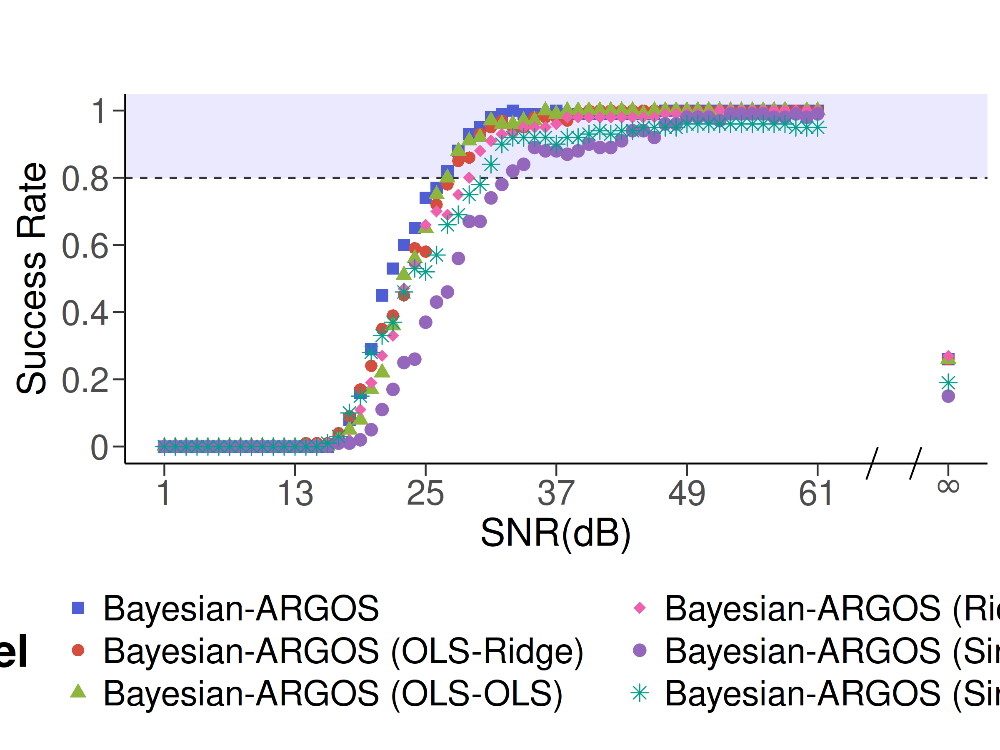

In [11]:
rect1 <- data.frame(xmin = -Inf, xmax = Inf, ymin = 0.8, ymax = Inf)

total_correct <- total_success_rate_table_snr
# The last snr level of each model is the noise-free case (snr = Inf);
# move it to x = 73 so it sits beyond the axis break.
total_correct$snr[total_correct$snr == 62] <- 73
models_name <- unique(total_correct$Model)
total_correct$Model <- factor(total_correct$Model, levels = models_name)

x_labels <- x_breaks <- seq(1, 73, by = 12)
x_labels[length(x_labels)] <- TeX("$\\infty$")

y_labels <-
    y_breaks <-
    pretty_breaks()(c(min(total_correct$Value), max(total_correct$Value)))

xstart <- 65.5
xend <- 69.5
extra_x <- 1
y_sep <- min(total_correct$Value) - 0.05 * (min(total_correct$Value))
myseg <- create_separators(c(xstart, xend), extra_x = 1, y = y_sep, extra_y = 0.1, angle = 75)

prob_increase_snr <-
    ggplot() +
    geom_hline(yintercept = 0.8, lty = 2) +
    geom_rect(data = rect1, aes(xmin = xmin, xmax = xmax, ymin = ymin, ymax = ymax), alpha = 0.3, fill = "#BDB6FB") +
    geom_point(
        data = total_correct,
        aes(
            x = snr,
            y = Value,
            fill = Model,
            col = Model,
            shape = Model
        ), size = 3
    ) +
    labs(
        y = "Success Rate",
        x = TeX("SNR(dB)")
    ) +
    scale_x_continuous(
        limits = c(
            min(x_breaks),
            max(x_breaks)
        ),
        labels = x_labels,
        breaks = x_breaks
    ) +
    scale_y_continuous(
        labels = y_labels,
        breaks = y_breaks,
        limits = c(NA, max(y_breaks))
    ) +
    ggplot_theme1 +
    theme(legend.position = "bottom") +
    scale_fill_manual(values = colors_correct, breaks = models_name, labels = models_name) +
    scale_colour_manual(values = colors_correct, breaks = models_name, labels = models_name) +
    scale_shape_manual(values = shapes, breaks = models_name, labels = models_name) +
    guides(
        x = guide_axis_truncated(
            trunc_lower = c(-Inf, xend + extra_x / 2),
            trunc_upper = c(xstart + extra_x / 2, Inf)
        ),
        colour = guide_legend(nrow = 3),
        fill = guide_legend(nrow = 3),
        shape = guide_legend(nrow = 3)
    ) +
    annotate("segment",
        x = myseg$x, xend = myseg$xend,
        y = myseg$y + 0.05, yend = myseg$yend
    ) +
    coord_cartesian(clip = "off", ylim = c(-0.0005, NA))

nbfigsize(
    width = 8,
    height = 6
)

prob_increase_snr

### Combine the two panels and save the figure


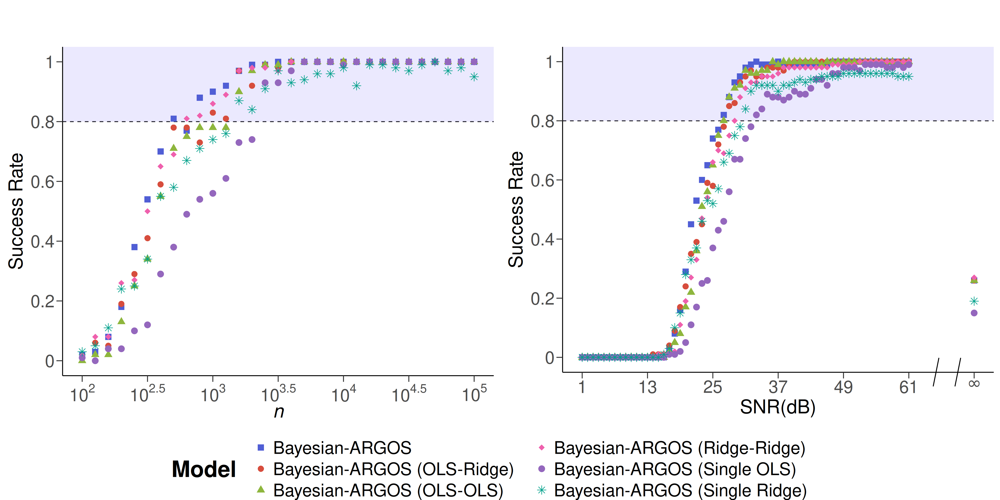

In [12]:
gglegend <- get_legend(prob_increase_snr)

system_comprehensive <-
    arrangeGrob(prob_increase_n + theme(legend.position = "none"),
        prob_increase_snr + theme(legend.position = "none"),
        nrow = 1
    )
nbfigsize(
    width = 16,
    height = 8
)
system_comprehensive <- grid.arrange(system_comprehensive, gglegend, ncol = 1, heights = c(14, 2))
ggsave(plot = system_comprehensive, filename = sprintf(
        "./ResultsAnalysis/success-rate-plots/imgs/%s_ablation_success_rate_plot.pdf",
        dynamical_system_name
    ), width = 16, height = 8, dpi = 600, units = "in")